In [116]:
%reload_ext autoreload
%autoreload 2

import pickle
import numpy as np
import matplotlib.pyplot as plt
from einops import rearrange

import torch
import torchvision.transforms as transforms
import torch.nn as nn
from torchmetrics.image.fid import FrechetInceptionDistance
from torchvision.models import ViT_H_14_Weights, vit_h_14
from PIL import Image

import scipy
from sklearn.manifold import TSNE, MDS

import os
import sys
sys.path.append('../')
sys.path.append('code/')

from dataset import create_Kamitani_dataset, create_THINGS_dataset
from config import Config_Generative_Model

from dc_ldm.ldm_for_fmri import fLDM
from ldm_finetune import channel_last, normalize, random_crop, fmri_transform
import eval_metrics

device = 'cuda'

In [79]:
## Graph styling

plt.style.use('seaborn-v0_8-paper')

from cycler import cycler
colors = cycler('color', ['#e63946', '#006699', '#fcd581', '#a1c349', '#ff9ebb', '#C2BBF0', '#f27f34', '#48631d', '#55bbee', '#B2BFB5'])

plt.rc('figure', dpi=200, figsize=(10,90/16))
plt.rc('font', size=12, weight=500)
plt.rc('lines', linewidth=2)
plt.rc('axes', facecolor='FAFAFA', axisbelow=True, grid=True, prop_cycle=colors, edgecolor='white', labelcolor='dimgrey')
plt.rc('grid', color='D1D1D1', linestyle='-', linewidth=0.7)
plt.rc('legend', edgecolor='D1D1D1')

def get_color(i):
    return str(plt.rcParams['axes.prop_cycle'].by_key()['color'][i])

#### Define generative model (obsolete)

In [81]:
config = Config_Generative_Model()

crop_pix = int(config.crop_ratio*config.img_size)
img_transform_train = transforms.Compose([
    normalize,
    random_crop(config.img_size-crop_pix, p=0.5),
    transforms.Resize((256, 256)), 
    channel_last
])
img_transform_test = transforms.Compose([
    normalize, transforms.Resize((256, 256)), 
    channel_last
])
if config.dataset == 'GOD':
    fmri_train_god, fmri_test_god = create_Kamitani_dataset(config.kam_path, config.roi, config.patch_size, 
            fmri_transform=fmri_transform, image_transform=[img_transform_train, img_transform_test], 
            subjects=config.kam_subs)
    num_voxels = fmri_train_god.num_voxels

In [82]:
model_path = '/home/aip/dufly/Documents/GOD/results/generation/28-06-2024-17-16-16/checkpoint_best.pth'
sd = torch.load(model_path, map_location='cpu')
config = sd['config']

config.pretrain_mbm_path

In [84]:
pretrain_mbm_metafile = torch.load(config.pretrain_mbm_path, map_location='cpu')

# create generative model
generative_model = fLDM(pretrain_mbm_metafile, num_voxels,
            device=device, pretrain_root=config.pretrain_gm_path, logger=None,
            ddim_steps=config.ddim_steps, global_pool=config.global_pool, use_time_cond=config.use_time_cond)
generative_model.model.load_state_dict(sd['model_state_dict'])

LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 401.32 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 3, 64, 64) = 12288 dimensions.
making attention of type 'vanilla' with 512 in_channels
missing keys: ['decoder_pos_embed', 'cross_map_in.weight', 'cross_map_in.bias', 'cross_map_out.weight', 'cross_map_out.bias', 'decoder_embed.weight', 'decoder_embed.bias', 'decoder_blocks.0.norm1.weight', 'decoder_blocks.0.norm1.bias', 'decoder_blocks.0.attn.qkv.weight', 'decoder_blocks.0.attn.qkv.bias', 'decoder_blocks.0.attn.proj.weight', 'decoder_blocks.0.attn.proj.bias', 'decoder_blocks.0.norm2.weight', 'decoder_blocks.0.norm2.bias', 'decoder_blocks.0.mlp.fc1.weight', 'decoder_blocks.0.mlp.fc1.bias', 'decoder_blocks.0.mlp.fc2.weight', 'decoder_blocks.0.mlp.fc2.bias', 'decoder_blocks.1.norm1.weight', 'decoder_blocks.1.norm1.bias', 'decoder_blocks.1.attn.qkv.weight', 'decoder_blocks.1.attn.qkv.bias', 'decoder_blocks.1.attn.proj.wei

<All keys matched successfully>

In [85]:
generative_model.model.to(device)

LatentDiffusion(
  (model): DiffusionWrapper(
    (diffusion_model): UNetModel(
      (time_embed): Sequential(
        (0): Linear(in_features=192, out_features=768, bias=True)
        (1): SiLU()
        (2): Linear(in_features=768, out_features=768, bias=True)
      )
      (time_embed_condtion): Sequential(
        (0): Conv1d(77, 38, kernel_size=(1,), stride=(1,))
        (1): Conv1d(38, 1, kernel_size=(1,), stride=(1,))
        (2): Linear(in_features=512, out_features=768, bias=True)
      )
      (input_blocks): ModuleList(
        (0): TimestepEmbedSequential(
          (0): Conv2d(3, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (1-2): 2 x TimestepEmbedSequential(
          (0): ResBlock(
            (in_layers): Sequential(
              (0): GroupNorm32(32, 192, eps=1e-05, affine=True)
              (1): SiLU()
              (2): Conv2d(192, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            )
            (h_upd): Identity()
    

#### ResNet feature extraction (obsolete)

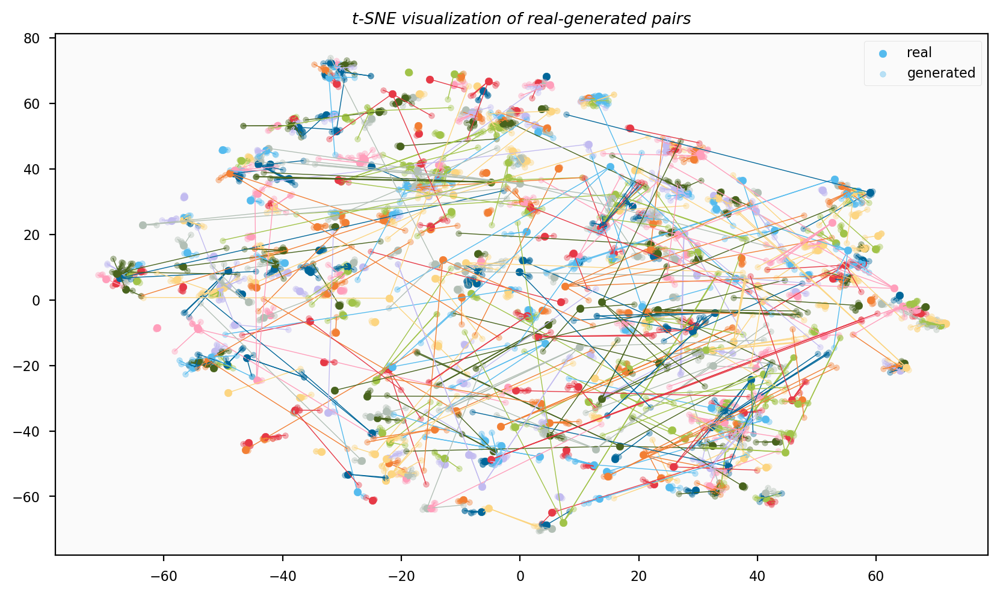

In [82]:
tsne = TSNE(n_components=2, random_state=0)
X = np.array(real_features + [f for line in fake_features for f in line])
X_embedded = tsne.fit_transform(X)

distances_per_img = distances.reshape(-1, 5)
distances_per_img = np.mean(distances_per_img, axis=1)

X_real = X_embedded[:len(real_features)]
X_fake = X_embedded[len(real_features):]

percent = 0.7
n = int(percent*len(distances_per_img))

idx = np.argsort(distances_per_img)[:n]

for i in range(600):
    i = idx[i]
    c = get_color(i%10)
    plt.scatter(X_real[i, 0], X_real[i, 1], c=c, label='real', s=20)
    for j in range(5):
        plt.scatter(X_fake[i*5+j, 0], X_fake[i*5+j, 1], c=c, label='fake', alpha=0.4, s=12)
        plt.plot([X_real[i, 0], X_fake[i*5+j, 0]], [X_real[i, 1], X_fake[i*5+j, 1]], c=c, linewidth=0.5)

for loc in ['top', 'bottom', 'right', 'left']:
    plt.gca().spines[loc].set_color('black')
    plt.gca().spines[loc].set_visible(True)

plt.grid(False)
plt.title('t-SNE visualization of real-generated pairs', style='italic')

plt.legend(['real', 'generated'], loc='upper right')

plt.show()

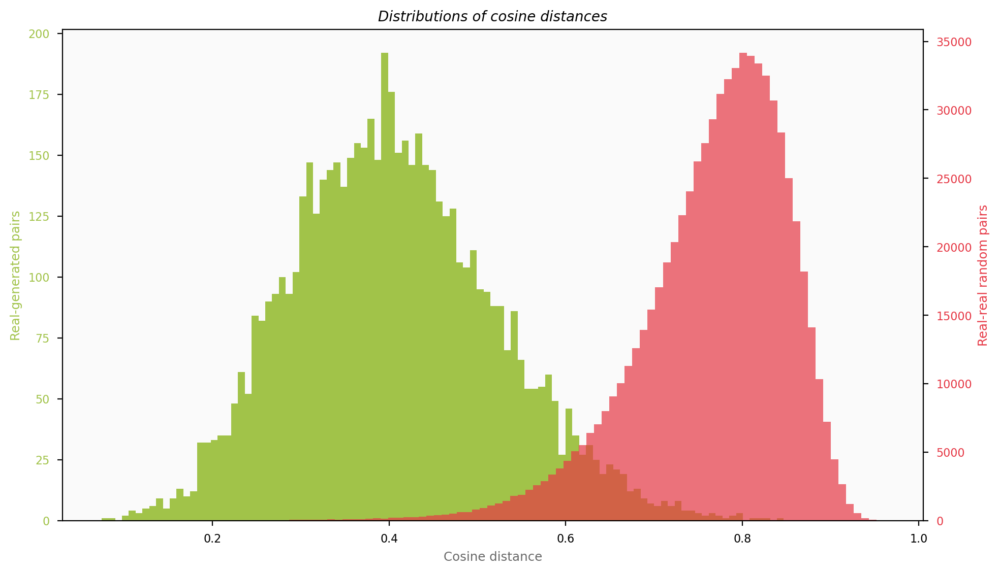

In [81]:
# compare distances and real distance on the same graph using histograms
# use two different y-axis for the two histograms

fig, ax1 = plt.subplots()

color = get_color(3)
ax1.set_xlabel('Cosine distance')
ax1.set_ylabel('Real-generated pairs', color=color)
ax1.hist(distances, bins=100, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = get_color(0)
ax2.set_ylabel('Real-real random pairs', color=color)
ax2.hist(real_distances, bins=100, color=color, alpha=0.7)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.grid(False)
ax1.grid(False)

# set bottom border to black and visible
for loc in ['top', 'bottom', 'right', 'left']:
    plt.gca().spines[loc].set_color('black')
    plt.gca().spines[loc].set_visible(True)

plt.title('Distributions of cosine distances', style='italic', fontsize='small')
plt.show()

## Full testing pipeline for diffusion models

In [113]:
## loading the dataset and the diffusion model

def get_dataset(sub, dataset="GOD"):

    config = Config_Generative_Model()
    num_voxels = 4656

    crop_pix = int(config.crop_ratio*config.img_size)
    img_transform_train = transforms.Compose([
        normalize,
        random_crop(config.img_size-crop_pix, p=0.5),
        transforms.Resize((256, 256)), 
        channel_last
    ])
    img_transform_test = transforms.Compose([
        normalize, transforms.Resize((256, 256)), 
        channel_last
    ])
    if dataset == "GOD":
        fmri_train, fmri_test = create_Kamitani_dataset(config.kam_path, config.roi, config.patch_size, 
                fmri_transform=fmri_transform, image_transform=[img_transform_train, img_transform_test], 
                subjects=sub)
    elif dataset == "THINGS":
        fmri_train, fmri_test = create_THINGS_dataset(patch_size=config.patch_size, restriction=None)
        num_voxels = fmri_train.num_voxels
    else:
        raise NotImplementedError
    
    if fmri_train.fmri.shape[-1] < num_voxels:
        fmri_train.fmri = np.pad(fmri_train.fmri, ((0,0), (0, num_voxels - fmri_train.fmri.shape[-1])), 'wrap')
    else:
        fmri_train.fmri = fmri_train.fmri[:, :num_voxels]

    if fmri_test.fmri.shape[-1] < num_voxels:
        fmri_test.fmri = np.pad(fmri_test.fmri, ((0,0), (0, num_voxels - fmri_test.fmri.shape[-1])), 'wrap')
    else:
        fmri_test.fmri = fmri_test.fmri[:, :num_voxels]
    
    return fmri_train, fmri_test, num_voxels

def get_model(model_path, num_voxels):

    sd = torch.load(model_path, map_location='cpu')
    config = sd['config']

    print("MBM path:", config.pretrain_mbm_path)
    pretrain_mbm_metafile = torch.load(config.pretrain_mbm_path, map_location='cpu')
    
    # Create generative model
    generative_model = fLDM(pretrain_mbm_metafile, num_voxels,
                device=device, pretrain_root=config.pretrain_gm_path, logger=None,
                ddim_steps=config.ddim_steps, global_pool=config.global_pool, use_time_cond=config.use_time_cond)
    
    generative_model.model.load_state_dict(sd['model_state_dict'])
    generative_model.model.to(device)

    return generative_model, config

## generating images using the diffusion model

def generate_images(gen_model, data):
    data['image'] = torch.Tensor(data['image']).unsqueeze(0).to(device)
    data['fmri'] = torch.Tensor(data['fmri']).unsqueeze(0).to(device)

    _, samples, _ = gen_model.model.generate(data, 5)
    return samples

def full_dataset_generate(gen_model, fmri_train_god, fmri_test_god, test_only=True):
    
    all_samples_test = []
    for stim_fmri_pair in fmri_test_god:
        all_samples_test.append(generate_images(gen_model, stim_fmri_pair))

    all_samples_test = [rearrange(s[0], 'b c h w -> b h w c') for s in all_samples_test]
    real_test = torch.tensor([s[0] for s in all_samples_test]).permute(0, 3, 1, 2)
    gen_test = torch.tensor([s[1:] for s in all_samples_test]).permute(0, 1, 4, 2, 3)

    if test_only:
        return real_test, gen_test

    all_samples_train = []
    for stim_fmri_pair in fmri_train_god:
        all_samples_train.append(generate_images(gen_model, stim_fmri_pair))

    all_samples_train = [rearrange(s[0], 'b c h w -> b h w c') for s in all_samples_train]
    real_train = torch.tensor([s[0] for s in all_samples_train]).permute(0, 3, 1, 2)
    fake_train = torch.tensor([s[1:] for s in all_samples_train]).permute(0, 1, 4, 2, 3)

    return real_train, fake_train, real_test, gen_test

def save_generated(real_test, fake_test, real_train=None, fake_train=None, path=''):
    os.makedirs(path, exist_ok=True)
    
    if real_train is not None and fake_train is not None:
        with open(path+"train_images.pkl", 'wb') as f:
            pickle.dump([real_train, fake_train], f)

    with open(path+"test_images.pkl", 'wb') as f:
        pickle.dump([real_test, fake_test], f)
    
def load_generated(path):
    with open(path+"test_images.pkl", 'rb') as f:
        real_test, fake_test = pickle.load(f)
    try:
        with open(path+"train_images.pkl", 'rb') as f:
            real_train, fake_train = pickle.load(f)
        return real_train, fake_train, real_test, fake_test
    except:
        return real_test, fake_test

## feature extraction using resnet

def frechet_distance(real, gen):
    fid = FrechetInceptionDistance(normalize=True)
    fid.update(real, real=True)

    gen = gen.reshape(-1, 3, 256, 256)
    fid.update(gen, real=False)

    fid = float(fid.compute())

    print(f"FID: {fid}")
    return fid

def extract_features(image_input, model):
    image_input = transforms.ToTensor()(image_input).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image_input)
    return output.cpu().numpy().flatten()

def full_dataset_extract(real, gen):
    print(f'Using {device} for feature extraction')

    resnet50 = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_resnet50', pretrained=True)
    resnet50.eval().to(device)
    resnet50.fc = nn.Identity()

    real_features = [extract_features(img.permute(1, 2, 0).numpy(), resnet50) for img in real]
    print("Finished real images")

    gen = gen.reshape(-1, 5, 3, 256, 256)

    gen_features = []
    for i in range(gen.shape[0]):
        line_features = []
        for j in range(gen.shape[1]):
            img = gen[i, j].permute(1, 2, 0).numpy()
            line_features.append(extract_features(img, resnet50))
        gen_features.append(line_features)
        if i % 200 == 0:
            print(f"Finished gen images {i} over {gen.shape[0]}")
    
    return real_features, gen_features

def compute_distances(real_features, gen_features, euclidean=False):

    def compare_features(real_features, gen_features):
        distances = []
        for i in range(len(real_features)):
            real = real_features[i]
            fake = gen_features[i]
            # use euclidean distance if euclidean is True
            if euclidean:
                dist = [scipy.spatial.distance.euclidean(real, f) for f in fake]
            else:
                dist = [scipy.spatial.distance.cosine(real, f) for f in fake]
            distances.append(dist)
        return distances

    distances = compare_features(real_features, gen_features)
    distances = np.array(distances).flatten()

    real_distances = []
    for i in range(len(real_features)):
        for j in range(i+1, len(real_features)):
            if euclidean:
                dist = scipy.spatial.distance.euclidean(real_features[i], real_features[j])
            else:
                dist = scipy.spatial.distance.cosine(real_features[i], real_features[j])
            real_distances.append(dist)
        
    return distances, real_distances

## plots from extracted features

def plot_distances(distances, real_distances):
    fig, ax1 = plt.subplots()

    color = get_color(3)
    ax1.set_xlabel('Cosine distance')
    ax1.set_ylabel('Real-generated pairs', color=color)
    ax1.hist(distances, bins=50, color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()
    color = get_color(0)
    ax2.set_ylabel('Real-real random pairs', color=color)
    ax2.hist(real_distances, bins=50, color=color, alpha=0.7)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()
    plt.grid(False)
    ax1.grid(False)

    # set bottom border to black and visible
    for loc in ['top', 'bottom', 'right', 'left']:
        plt.gca().spines[loc].set_color('black')
        plt.gca().spines[loc].set_visible(True)

    plt.title('Distributions of cosine distances', style='italic', fontsize='small')
    plt.show()
    pass

def plot_embeddings(real_features, gen_features, n):

    tsne = TSNE(n_components=2, random_state=0)
    X = np.array(real_features + [f for line in gen_features for f in line])
    X_embedded = tsne.fit_transform(X)

    distances_per_img = distances.reshape(-1, 5)
    distances_per_img = np.mean(distances_per_img, axis=1)

    X_real = X_embedded[:len(real_features)]
    X_fake = X_embedded[len(real_features):]

    idx = np.argsort(distances_per_img)

    for i in range(n):
        i = idx[i]
        c = get_color(i%10)
        plt.scatter(X_real[i, 0], X_real[i, 1], c=c, label='real', s=20)
        for j in range(5):
            plt.scatter(X_fake[i*5+j, 0], X_fake[i*5+j, 1], c=c, label='fake', alpha=0.4, s=12)
            plt.plot([X_real[i, 0], X_fake[i*5+j, 0]], [X_real[i, 1], X_fake[i*5+j, 1]], c=c, linewidth=0.5)

    for loc in ['top', 'bottom', 'right', 'left']:
        plt.gca().spines[loc].set_color('black')
        plt.gca().spines[loc].set_visible(True)

    plt.grid(False)
    plt.title('t-SNE visualization of real-generated pairs', style='italic')

    plt.legend(['real', 'generated'], loc='upper right')

    plt.show()

## top-k n-way metrics

def get_n_way_top_k_acc(pred_imgs, ground_truth, n_way, num_trials, top_k, device, return_std=False):
    weights = ViT_H_14_Weights.DEFAULT
    model = vit_h_14(weights=weights)
    preprocess = weights.transforms()
    model = model.to(device)
    model = model.eval()
    
    acc_list = []
    std_list = []
    for pred, gt in zip(pred_imgs, ground_truth):
        # convert tensor to Image
        pred = Image.fromarray((pred).astype(np.uint8))
        gt = Image.fromarray((gt).astype(np.uint8))
        pred = preprocess(pred).unsqueeze(0).to(device)
        gt = preprocess(gt).unsqueeze(0).to(device)
        gt_class_id = model(gt).squeeze(0).softmax(0).argmax().item()
        pred_out = model(pred).squeeze(0).softmax(0).detach()

        acc, std = eval_metrics.n_way_top_k_acc(pred_out, gt_class_id, n_way, num_trials, top_k)
        acc_list.append(acc)
        std_list.append(std)
       
    if return_std:
        return acc_list, std_list
    return acc_list

def compute_nway_metric(real_images, fake_images, n_way=50, num_trials=100, top_k=1):
    pred_imgs = rearrange(fake_images[:, 0], 'b c h w -> b h w c')
    ground_truth = rearrange(real_images, 'b c h w -> b h w c')

    pred_imgs = pred_imgs.cpu().numpy()
    ground_truth = ground_truth.cpu().numpy()

    acc, acc_std = get_n_way_top_k_acc(pred_imgs, ground_truth, n_way, num_trials, top_k, device, return_std=True)

    return acc, acc_std

def plot_nway_metric(acc, n_way=50, top_k=1):
    print(np.mean(acc), np.std(acc))

    plt.hist(acc, bins=20)
    plt.xlabel('Accuracy')
    plt.ylabel('Frequency')
    plt.title(f'Accuracy histogram, top-{top_k} {n_way}-way')
    plt.show()

In [114]:
def full_pipeline(model_path, gen_img_path, sub, dataset='GOD'):

    fmri_train_god, fmri_test_god, num_voxels = get_dataset(sub, dataset=dataset)

    generative_model, _ = get_model(model_path, num_voxels)

    real_test, gen_test = full_dataset_generate(generative_model, fmri_train_god, fmri_test_god)
    save_generated(real_test, gen_test, path=gen_img_path)

    return half_pipeline(gen_img_path)

def half_pipeline(gen_img_path):

    real_test, gen_test = load_generated(gen_img_path)

    fid = frechet_distance(real_test, gen_test)

    real_features, gen_features = full_dataset_extract(real_test, gen_test)
    distances, real_distances = compute_distances(real_features, gen_features)

    accuracies = []
    for n_way in [50,100]:
        for top_k in [1,5]:
            acc, _ = compute_nway_metric(real_test, gen_test, n_way=n_way, num_trials=100, top_k=top_k)
            accuracies.append(acc)

    return real_test, gen_test, real_features, gen_features, distances, real_distances, fid, accuracies

#### GOD dataset

In [ ]:
path_cross = 'results/generation/17-06-2024-15-31-45/checkpoint_best.pth'
path_crl = 'results/generation/28-06-2024-17-16-16/checkpoint_best.pth'
path_none = 'results/generation/08-07-2024-11-31-52/checkpoint_best.pth'

results = []

for model_type, path in zip(['cross', 'crl', 'none'], [path_cross, path_crl, path_none]):
    for sub in [['sbj_1'], ['sbj_2'], ['sbj_3'], ['sbj_4'], ['sbj_5']]:
        gen_img_path = f'generated_images/{sub}_{model_type}/'
        real_test, gen_test, real_features, gen_features, distances, real_distances, fid, accuracies = full_pipeline(path, gen_img_path, sub)

        result = {
            'model_type': model_type,
            'sub': sub,
            'real_test': real_test,
            'gen_test': gen_test,
            'real_features': real_features,
            'gen_features': gen_features,
            'distances': distances,
            'real_distances': real_distances,
            'fid': fid,
            'accuracies': accuracies
        }

        results.append(result)

with open('results/GOD_ALL_RESULTS.pkl', 'wb') as f:
    pickle.dump(results, f)

In [6]:
# load results

with open('results/GOD_ALL_RESULTS.pkl', 'rb') as f:
    results = pickle.load(f)

In [7]:
# show the fid_values matrix as a heatmap

def display_metric_matrix(mat, title=None, do_int=False):
    fig, ax = plt.subplots()

    plot_values = np.zeros((3, 5))

    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            if mat[i, j] < 240:
                plot_values[i, j] = mat[i, j] + 10
            else:
                plot_values[i, j] = mat[i, j]

    cax = ax.matshow(-plot_values, cmap='RdYlGn')

    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            if do_int:
                if int(mat[i, j]) == np.min(mat[:, j].astype(int)):
                    ax.text(j, i, int(mat[i, j]), ha='center', va='center', color='black', fontsize='small', fontweight='bold')
                else:
                    ax.text(j, i, int(mat[i, j]), ha='center', va='center', color='#111111', fontsize='small')
            else:
                if mat[i, j] == np.min(mat[:, j]):
                    ax.text(j, i, np.round(mat[i, j],2), ha='center', va='center', color='black', fontsize='small', fontweight='bold')
                else:
                    ax.text(j, i, np.round(mat[i, j],2), ha='center', va='center', color='#111111', fontsize='small')

    plt.grid(False)
    for loc in ['top', 'bottom', 'right', 'left']:
        plt.gca().spines[loc].set_color('black')
        plt.gca().spines[loc].set_visible(True)

    plt.xticks([0, 1, 2, 3, 4], ['Subject 1', 'Subject 2', 'Subject 3', 'Subject 4', 'Subject 5'])

    labels = ['No interaction', 'Cross-attention', 'CRL (maxout)']
    ax.set_yticks([0, 1, 2], labels, rotation='vertical', va="center")

    if title is not None:
        plt.title(title, style='italic', fontsize='x-small')#, y=-0.07)
    plt.tick_params(bottom = False)

    plt.show()

In [8]:
# retrieve fid values in a model_type x suject matrix

fid_values = np.zeros((3, 5))

for i in range(len(results)):
    model_type = results[i]['model_type']
    sub = results[i]['sub'][0]
    fid = results[i]['fid']

    if model_type == 'none':
        fid_values[0, int(sub[-1])-1] = fid
    elif model_type == 'cross':
        fid_values[1, int(sub[-1])-1] = fid
    else:
        fid_values[2, int(sub[-1])-1] = fid

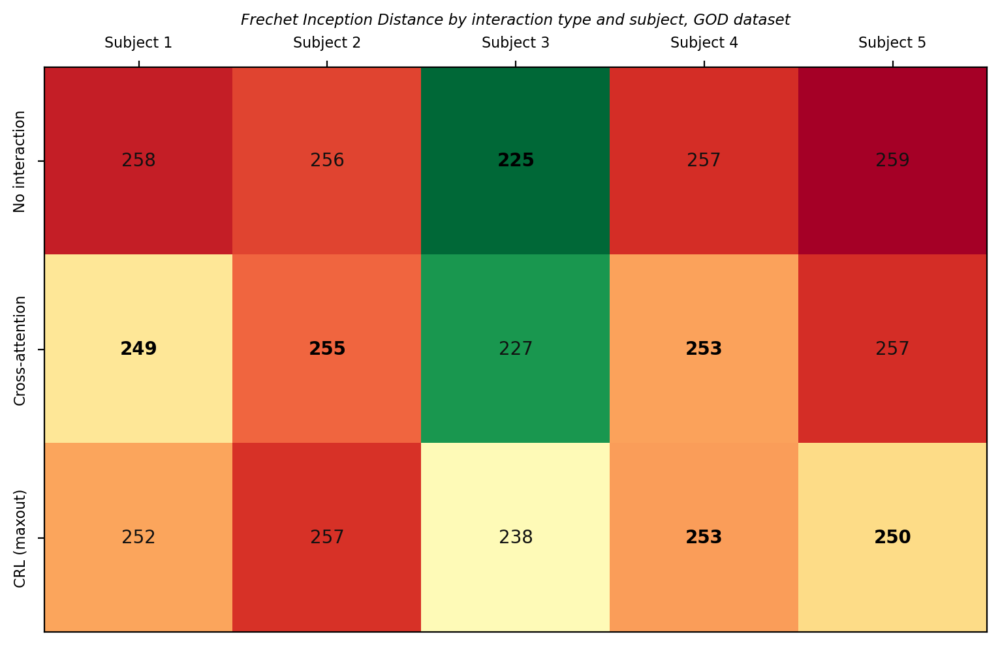

In [9]:
display_metric_matrix(fid_values, 'Frechet Inception Distance by interaction type and subject, GOD dataset', do_int=True)

/tmp/ipykernel_3017453/1143183799.py:24: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


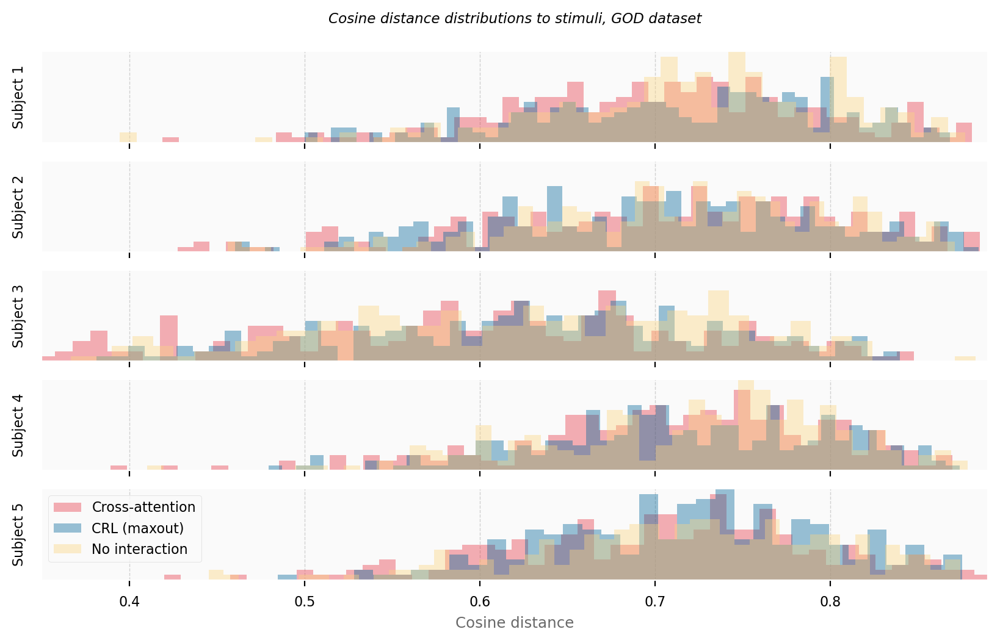

In [10]:
# set 5 graphs stacked vertically

fig, axs = plt.subplots(5, 1, sharex=True)

for model_type in [0,5,10]:
    for sub in [0,1,2,3,4]:
        result = results[model_type+sub]
        axs[sub].hist(result['distances'], bins=50, alpha=0.4)

# set a common x-axis
plt.xlabel('Cosine distance')
plt.legend(['Cross-attention', 'CRL (maxout)', 'No interaction'], loc='upper left')

for i, ax in enumerate(axs):
    ax.set_ylim(0,18)
    ax.tick_params(left = False)
    ax.set_yticks([9], [f'Subject {i+1}'], rotation='vertical', va='center')
    ax.grid(axis='y', linestyle='-', linewidth=0.)
    ax.grid(axis='x', linestyle='--', linewidth=0.5)

plt.xlim(0.35,0.89)
plt.title('Cosine distance distributions to stimuli, GOD dataset', style='italic', fontsize='x-small',y=6)

plt.tight_layout()
plt.show()

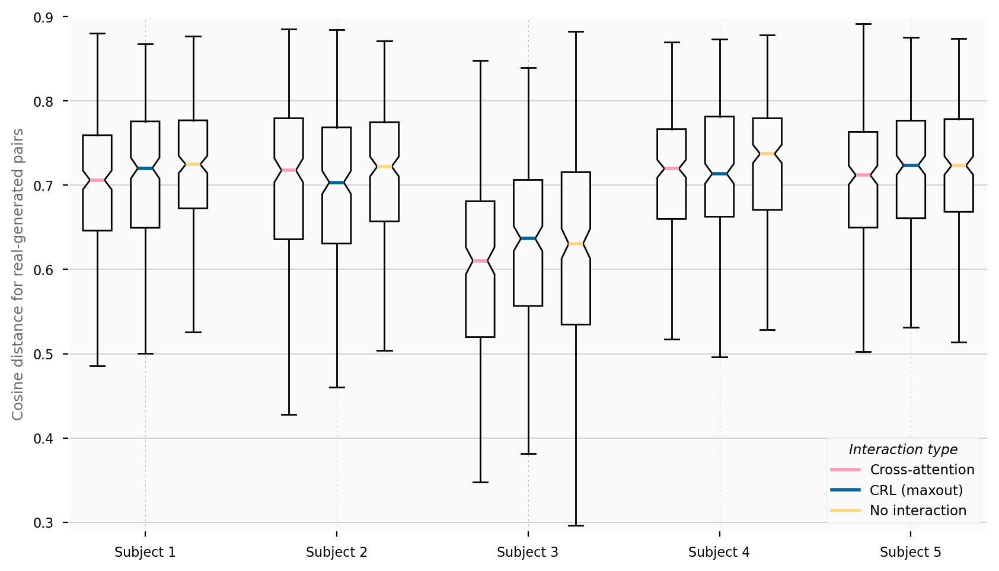

In [26]:
fig, ax = plt.subplots()

for i in [4,1,2]:
    plt.plot([0],[0], color=get_color(i))

for x in [0.25,1.25,2.25,3.25,4.25]:
    ax.axvline(x, color='grey', linestyle=(0, (5, 10)), linewidth=0.2)

for model_type in [0,5,10]:
    for sub in [0,1,2,3,4]:
        color = 4 if model_type == 0 else (1 if model_type == 5 else 2)
        distances = results[model_type+sub]['distances']
        ax.boxplot(distances, positions=[sub+model_type*0.05], showfliers=False, notch=True, patch_artist=True, medianprops={'linewidth':2, 'color':get_color(color)}, boxprops={'facecolor':'#FAFAFA'}, )

ax.grid(axis='x', linestyle='-', linewidth=0.)

plt.xticks([0.25,1.25,2.25,3.25,4.25], ['Subject 1', 'Subject 2', 'Subject 3', 'Subject 4', 'Subject 5'])
plt.ylabel('Cosine distance for real-generated pairs')

plt.xlim(-0.15, 4.65)
plt.ylim(0.29, 0.9)

ax.legend(['Cross-attention', 'CRL (maxout)', 'No interaction'], title='Interaction type', fontsize='x-small', title_fontproperties={'style':'italic', 'size':'x-small'}, loc='lower right')

plt.show()

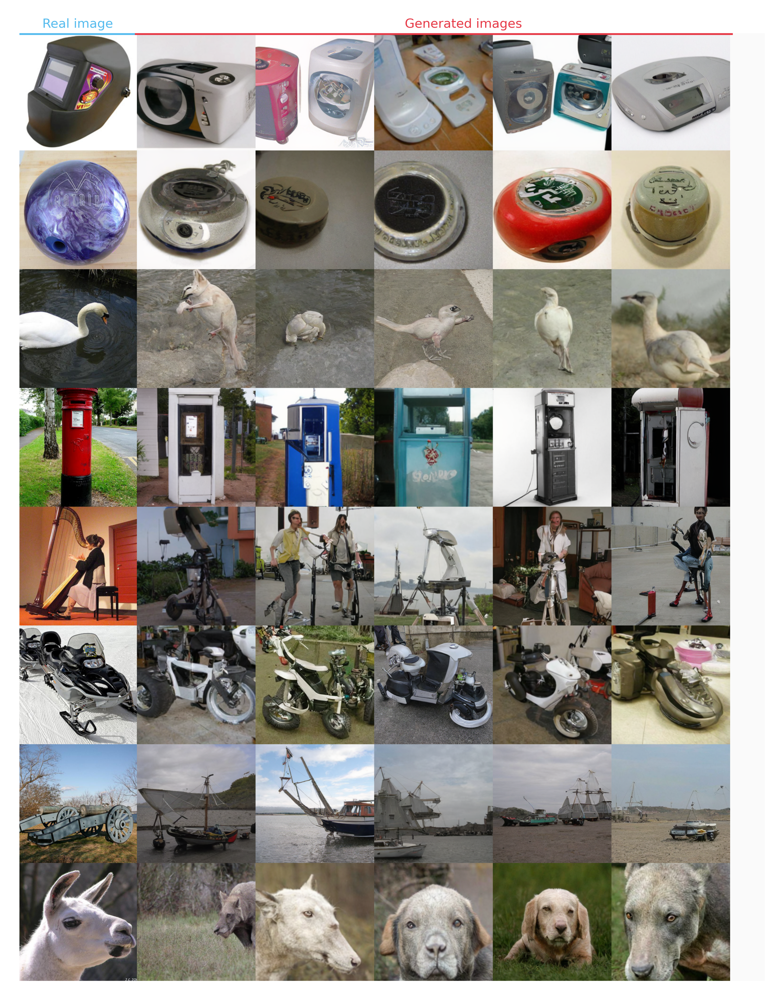

In [65]:
sub = 3
result = results[0+sub-1]

distances_per_img = result['distances'].reshape(-1, 5)
distances_per_img = np.mean(distances_per_img, axis=1)

idx = np.argsort(distances_per_img)

image_lines = []

for i in [2,3,9,12,13,25,33,38]:
    image_lines.append(np.hstack([rearrange(result['real_test'][idx[i]], 'c h w -> h w c')]+[rearrange(gen, 'c h w -> h w c') for gen in result['gen_test'][idx[i]]]))

fig, ax = plt.subplots(dpi=600)
ax.set_aspect('equal', 'box')

image_grid = np.vstack(image_lines)

ax.imshow(image_grid)

ax.tick_params(left = False, bottom = False)
ax.set_yticks([], [])
ax.set_xticks([], [])

ax.plot([0,256],[0,0], color=get_color(8))
ax.plot([256,1536],[0,0], color=get_color(0))

ax.text(128, -17, 'Real image', ha='center', va='center', fontsize=5, color=get_color(8))
ax.text(704+256, -17, 'Generated images', ha='center', va='center', fontsize=5, color=get_color(0))

plt.grid(False)
fig.tight_layout()

In [ ]:
# retrieve accuracy values in a model_type x suject matrix

accuracy_values = np.zeros((3, 5))

for i in range(len(results)):
    model_type = results[i]['model_type']
    sub = results[i]['sub'][0]
    acc = np.mean(results[i]['accuracies'][0])

    if model_type == 'none':
        accuracy_values[0, int(sub[-1])-1] = acc
    elif model_type == 'cross':
        accuracy_values[1, int(sub[-1])-1] = acc
    else:
        accuracy_values[2, int(sub[-1])-1] = acc

In [ ]:
result = results[2]

distances, real_distances, real_features, gen_features, acc = result['distances'], result['real_distances'], result['real_features'], result['gen_features'], result['accuracies'][0]

plot_distances(distances, real_distances)
plot_embeddings(real_features, gen_features, 50)
plot_nway_metric(acc, n_way=50, top_k=1)

#### THINGS dataset

In [ ]:
path_crl = 'results/generation/04-07-2024-17-43-07/checkpoint_best.pth'

results = []

for model_type, path in zip(['crl'], [path_crl]):
    for sub in [['all_sbj']]:
        gen_img_path = f'generated_images/{sub}_THINGS_{model_type}/'
        real_test, gen_test, real_features, gen_features, distances, real_distances, fid, accuracies = full_pipeline(path, gen_img_path, sub, dataset='THINGS')

        result = {
            'model_type': model_type,
            'sub': sub,
            'real_test': real_test,
            'gen_test': gen_test,
            'real_features': real_features,
            'gen_features': gen_features,
            'distances': distances,
            'real_distances': real_distances,
            'fid': fid,
            'accuracies': accuracies
        }

        results.append(result)

with open('results/THINGS_ALL_RESULTS.pkl', 'wb') as f:
    pickle.dump(results, f)

In [ ]:
# load results

with open('results/THINGS_ALL_RESULTS.pkl', 'rb') as f:
    results = pickle.load(f)

In [ ]:
result = results[0]

distances_per_img = result['distances'].reshape(-1, 5)
distances_per_img = np.mean(distances_per_img, axis=1)

idx = np.argsort(distances_per_img)

image_lines = []

for i in [2,3,11,16,24,25,27,29]:
    image_lines.append(np.hstack([rearrange(2*(result['real_test'][idx[i]]), 'c h w -> h w c')]+[rearrange(gen, 'c h w -> h w c') for gen in result['gen_test'][idx[i]]]))

fig, ax = plt.subplots(dpi=600)
ax.set_aspect('equal', 'box')

image_grid = np.vstack(image_lines)

ax.imshow(image_grid)

ax.tick_params(left = False, bottom = False)
ax.set_yticks([], [])
ax.set_xticks([], [])

ax.plot([0,256],[0,0], color=get_color(8))
ax.plot([256,1536],[0,0], color=get_color(0))

ax.text(128, -17, 'Real image', ha='center', va='center', fontsize=5, color=get_color(8))
ax.text(704+256, -17, 'Generated images', ha='center', va='center', fontsize=5, color=get_color(0))

plt.grid(False)
fig.tight_layout()

In [ ]:
# compare distances and real distance on the same graph using histograms
# use two different y-axis for the two histograms

distances = result['distances']
real_distances = result['real_distances']

fig, ax1 = plt.subplots()

color = get_color(3)
ax1.set_xlabel('Cosine distance')
ax1.set_ylabel('Real-generated pairs', color=color)
ax1.hist(distances, bins=100, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = get_color(0)
ax2.set_ylabel('Real-real random pairs', color=color)
ax2.hist(real_distances, bins=100, color=color, alpha=0.7)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.grid(False)
ax1.grid(False)

# set bottom border to black and visible
for loc in ['top', 'bottom', 'right', 'left']:
    plt.gca().spines[loc].set_color('black')
    plt.gca().spines[loc].set_visible(True)

plt.title('Distributions of cosine distances', style='italic', fontsize='small')
plt.show()

In [ ]:
real_features = result['real_features']
fake_features = result['gen_features']

tsne = TSNE(n_components=2, random_state=0)
X = np.array(real_features + [f for line in fake_features for f in line])
X_embedded = tsne.fit_transform(X)

distances_per_img = distances.reshape(-1, 5)
distances_per_img = np.mean(distances_per_img, axis=1)

X_real = X_embedded[:len(real_features)]
X_fake = X_embedded[len(real_features):]

percent = 0.7
n = int(percent*len(distances_per_img))

idx = np.argsort(distances_per_img)[:n]

for i in range(40):
    i = idx[i]
    c = get_color(i%10)
    plt.scatter(X_real[i, 0], X_real[i, 1], c=c, label='real', s=20)
    for j in range(5):
        plt.scatter(X_fake[i*5+j, 0], X_fake[i*5+j, 1], c=c, label='fake', alpha=0.4, s=12)
        plt.plot([X_real[i, 0], X_fake[i*5+j, 0]], [X_real[i, 1], X_fake[i*5+j, 1]], c=c, linewidth=0.5)

for loc in ['top', 'bottom', 'right', 'left']:
    plt.gca().spines[loc].set_color('black')
    plt.gca().spines[loc].set_visible(True)

plt.grid(False)
plt.title('t-SNE visualization of real-generated pairs', style='italic')

plt.legend(['real', 'generated'], loc='upper right')

plt.show()